In [1]:
import os
os.getcwd()

# Change directory to main repository directory in order to install modules
os.chdir(f"{os.environ['HOME']}/Code/ExoTiC-NEAT-training/")
os.environ["CUDA_VISIBLE_DEVICES"]="-1" # Disable GPU

In [2]:
%matplotlib inline

In [3]:
import numpy as np
import pandas as pd
import tensorflow as tf
import colour

from keras.layers import (
    Activation,
    BatchNormalization,
    Concatenate,
    Conv2D,
    Conv2DTranspose,
    Dropout,
    Input,
    MaxPooling2D,
    Dense,
)

from exotedrf import stage2, stage3
from astropy.io import fits
from keras.models import Model
from keras.optimizers import Adam, schedules
from matplotlib import pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from skimage.filters import threshold_otsu

2025-04-30 11:40:27.097946: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-04-30 11:40:27.097996: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-04-30 11:40:27.098036: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-30 11:40:27.106443: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


WebbPSF not installed. Profile simulation not available.


In [4]:

class Unet:
    """UNet model for image segmentation."""

    def __init__(
        self,
        input_shape: tuple,
        filters: int = 16,
        dropout: float = 0.05,
        batch_normalisation: bool = True,
        trained_model: str = None,
        image: np.ndarray = None,
        layers: int = 4,
        output_activation: str = "sigmoid",
        model: Model = None,
        reconstructed: np.ndarray = None,
        kernel_size: tuple = (3, 3),
        # _kernel_sizes: list[tuple] = [(5, 15), (5, 15), (3, 11), (3, 11), (3, 5), (3, 5)],
        # _kernel_sizes: list[tuple] = [(9, 71), (5, 39), (3, 23), (3, 11), (3, 5), (3, 3)],

        # Models 1, 2, & 3 kernel sizes
        # _kernel_sizes: list[tuple] = [(9, 17), (5, 13), (5, 9), (5, 9), (5, 7), (3, 5)],

         # Model 4 & 5 kernel sizes
        _kernel_sizes: list[tuple] = [(9, 17), (5, 5), (5, 9), (5, 9), (5, 7), (3, 3)],

        # Model 6 kernel sizes
        # _kernel_sizes: list[tuple] = [(9, 17), (5, 5), (5, 9)],
    ):
        """
        Initialise the UNet model.

        Parameters
        ----------
        input_shape : tuple
            The shape of the input image.
        filters : int
            The number of filters to use in the convolutional layers, default is 16.
        dropout : float
            The dropout rate, default is 0.05.
        batch_normalisation : bool
            Whether to use batch normalisation, default is True.
        trained_model : str
            The path to a trained model.
        image : np.ndarray
            The image to decode. Image must be 2D given as 4D numpy array, e.g. (1, 256, 256, 1).
            Image must be grayscale, e.g. not (1, 256, 256, 3). Image array row columns must
            be divisible by 2^layers, e.g. 256 % 2^4 == 0.
        layers : int
            The number of encoding and decoding layers, default is 4.
        output_activation : str
            The activation function for the output layer, either sigmoid or softmax.
            Default is sigmoid.
        model : keras.models.Model
            A pre-built model, populated by the build_model method.
        reconstructed : np.ndarray
            The reconstructed image, created by the decode_image method.
        """
        self.input_shape = input_shape
        self.filters = filters
        self.dropout = dropout
        self.batch_normalisation = batch_normalisation
        self.trained_model = trained_model
        self.image = image
        self._kernel_sizes = _kernel_sizes
        self.layers = len(_kernel_sizes)

        self.output_activation = output_activation
        self.model = model
        self.reconstructed = reconstructed
        self.kernel_size = kernel_size

        self.model = self.build_model()

    def convolutional_block(self, input_tensor, filters, kernel_size):
        """Convolutional block for UNet."""
        convolutional_layer = Conv2D(
            filters=filters,
            kernel_size=kernel_size,
            kernel_initializer="he_normal",
            padding="same",
        )
        batch_normalisation_layer = BatchNormalization()
        relu_layer = Activation("relu")

        if self.batch_normalisation:
            return relu_layer(batch_normalisation_layer(convolutional_layer(input_tensor)))
        return relu_layer(convolutional_layer(input_tensor))

    def encoding_block(self, input_tensor, filters, kernel_size):
        """Encoding block for UNet."""
        convolutional_block = self.convolutional_block(input_tensor, filters, kernel_size)
        max_pooling_layer = MaxPooling2D((2, 2), padding="same")
        dropout_layer = Dropout(self.dropout)

        return convolutional_block, dropout_layer(max_pooling_layer(convolutional_block))

    def decoding_block(self, input_tensor, concat_tensor, filters, kernel_size):
        """Decoding block for UNet."""
        transpose_convolutional_layer = Conv2DTranspose(
            filters, (kernel_size), strides=(2, 2), padding="same"
        )
        skip_connection = Concatenate()(
            [transpose_convolutional_layer(input_tensor), concat_tensor]
        )
        dropout_layer = Dropout(self.dropout)
        return self.convolutional_block(dropout_layer(skip_connection), filters, kernel_size)

    def build_model(self):
        """Build the UNet model."""
        input_image = Input(self.input_shape, name="img")
        current = input_image

        # Encoding Path
        convolutional_tensors = []
        for layer, ks in enumerate(self._kernel_sizes):
            convolutional_tensor, current = self.encoding_block(
                current, self.filters * (2 ** layer), ks
            )
            convolutional_tensors.append((convolutional_tensor))

        # Latent Convolutional Block
        latent_convolutional_tensor = self.convolutional_block(
            current, self.filters * 2 ** self.layers, self._kernel_sizes[-1],
        )

        # Decoding Path
        current = latent_convolutional_tensor
        for layer, ks in reversed([i for i in enumerate(self._kernel_sizes)]):
            current = self.decoding_block(
                current, convolutional_tensors[layer], self.filters * (2 ** layer), ks
            )

        # Model 1
        # outputs = Conv2D(1, (1, 1), activation=self.output_activation)(current)

        # Model 2
        # outputs = Dense(1, activation=self.output_activation)(current)

        # Model 3 & 4
        # outputs = tf.abs(Dense(1, activation=self.output_activation)(current))

        # Model 5
        outputs = tf.abs(Conv2D(1, (1, 1), activation=self.output_activation)(current))

        model = Model(inputs=[input_image], outputs=[outputs])
        return model

    def compile_model(self):
        """Compile the UNet model."""
        self.model.compile(
            optimizer=Adam(), loss="binary_crossentropy", metrics=["accuracy", "iou_score"]
        )
        return self.model

    def decode_image(self):
        """Returns images decoded by a trained model."""
        print(f"Predicting source segmentation using pre-trained model...")
        if self.trained_model is None or self.image is None:
            raise ValueError("Trained model and image arguments are required to decode image.")
        if isinstance(self.image, np.ndarray) is False:
            raise TypeError("Image must be a numpy array.")
        if len(self.image.shape) != 4:
            raise ValueError("Image must be 4D numpy array for example (1, 256, 256, 1).")
        if self.image.shape[3] != 1:
            raise ValueError("Input image must be grayscale.")
        if (
            self.image.shape[0] % 2 ** self.layers != 0
            and self.image.shape[1] % 2 ** self.layers != 0
        ):
            raise ValueError("Image shape should be divisible by 2^layers.")

        self.model = self.compile_model()
        self.model.load_weights(self.trained_model)
        self.reconstructed = self.model.predict(self.image)
        return self.reconstructed



# training_dataset = tf.data.Dataset.from_tensor_slices((data_train, labels_train))
# validation_dataset = tf.data.Dataset.from_tensor_slices((data_validation, labels_validation))

unet_model = Unet(input_shape=(256, 2048, 1), output_activation=None, layers=6, kernel_size=(5, 15))
model = unet_model.model

model.compile(
    optimizer=Adam(learning_rate=0.01),
    loss="mean_squared_error",
    metrics=["accuracy"],
)

print(model.summary())

2025-04-30 11:40:34.232719: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:268] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2025-04-30 11:40:34.232752: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:168] retrieving CUDA diagnostic information for host: typhon.star.bris.ac.uk
2025-04-30 11:40:34.232759: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:175] hostname: typhon.star.bris.ac.uk
2025-04-30 11:40:34.232841: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:199] libcuda reported version is: 570.133.20
2025-04-30 11:40:34.232865: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:203] kernel reported version is: NOT_FOUND: could not find kernel module information in driver version file contents: "NVRM version: NVIDIA UNIX Open Kernel Module for x86_64  570.86.15  Release Build  (root@typhon.star.bris.ac.uk)  Sat 15 Feb 06:26:27 GMT 2025
GCC version:  gcc versi

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 img (InputLayer)            [(None, 256, 2048, 1)]       0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 2048, 16)        2464      ['img[0][0]']                 
                                                                                                  
 batch_normalization (Batch  (None, 256, 2048, 16)        64        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 256, 2048, 16)        0         ['batch_normalization[0][0

In [5]:
# Model 1 weights
# model.load_weights("/data/typhon2/hattie/jwst/soss_simulations/unet_training_data/processed_data_2000/save_2025-04-09T12:49:46.275613/trained_model_varying_layers_2000_test_run_zeroth_scaled_1e7.weights.h5")

# Model 2 weights
# model.load_weights("/data/typhon2/hattie/jwst/soss_simulations/unet_training_data/processed_data_2000/save_2025-04-11T10:54:40.781107/trained_model_varying_layers_2000_test_run_zeroth_scaled_1e7.weights.h5")

# Model 3 weights
# model.load_weights("/data/typhon2/hattie/jwst/soss_simulations/unet_training_data/processed_data_2000/save_2025-04-14T11:18:47.974804/trained_model_varying_layers_2000_test_run_zeroth_scaled_1e7.weights.h5")

# Model 4 weights
# model.load_weights("/data/typhon2/hattie/jwst/soss_simulations/unet_training_data/processed_data_2000/save_2025-04-15T12:17:04.675635/trained_model_varying_layers_2000_test_run_zeroth_scaled_1e7.weights.h5")

# Model 5 weights
model.load_weights("/data/typhon2/hattie/jwst/soss_simulations/unet_training_data/processed_data_2000/save_2025-04-17T11:53:20.205254/trained_model_varying_layers_2000_test_run_zeroth_scaled_1e7.weights.h5")


2025-04-30 11:40:35,059 - stpipe - WARNING - Skipping variable loading for optimizer 'Adam', because it has 1 variables whereas the saved optimizer has 133 variables. 


TODO: cosine decay, increase training set to 4k

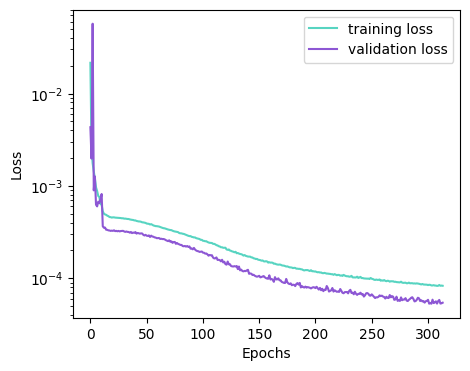

In [6]:
# Model 1 training logs
# logs = np.load("/data/typhon2/hattie/jwst/soss_simulations/unet_training_data/processed_data_2000/save_2025-04-09T12:49:46.275613/training_loss_varying_layers_2000_test_run_zeroth_scaled_1e7.npy", allow_pickle=True)

# Model 2 training logs
# logs = np.load("/data/typhon2/hattie/jwst/soss_simulations/unet_training_data/processed_data_2000/save_2025-04-11T10:54:40.781107/training_loss_varying_layers_2000_test_run_zeroth_scaled_1e7.npy", allow_pickle=True)

# Model 3 training logs
# logs = np.load("/data/typhon2/hattie/jwst/soss_simulations/unet_training_data/processed_data_2000/save_2025-04-14T11:18:47.974804/training_loss_varying_layers_2000_test_run_zeroth_scaled_1e7.npy", allow_pickle=True)

# Model 4 training logs
# logs = np.load("/data/typhon2/hattie/jwst/soss_simulations/unet_training_data/processed_data_2000/save_2025-04-15T12:17:04.675635/training_loss_varying_layers_2000_test_run_zeroth_scaled_1e7.npy", allow_pickle=True)

# Model 5 training logs
logs = np.load("/data/typhon2/hattie/jwst/soss_simulations/unet_training_data/processed_data_2000/save_2025-04-17T11:53:20.205254/training_loss_varying_layers_2000_test_run_zeroth_scaled_1e7.npy", allow_pickle=True)

losses = np.asarray(logs.item()["loss"])
val_losses = np.asarray(logs.item()["val_loss"])

fig, ax = plt.subplots(1, figsize=(5, 4))
ax.plot(losses, label="training loss", color="#57d4c1", marker="None")
ax.plot(val_losses, label="validation loss", color="#8d57d4", marker="None")

ax.set_xlabel("Epochs")
ax.set_ylabel("Loss")
ax.set_yscale("log")
ax.legend()

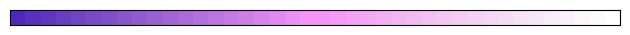

['#4e27bc' '#5630bd' '#5f37be' '#673dc0' '#6f43c2' '#7749c5' '#804fc7'
 '#8854ca' '#905acd' '#995fd0' '#a164d3' '#aa6ad7' '#b26fda' '#bb74de'
 '#c479e2' '#cd7ee6' '#d684ea' '#e089ee' '#ea8ef2' '#f494f7' '#f494f7'
 '#f39bf5' '#f2a2f4' '#f2a8f3' '#f2aff2' '#f1b5f2' '#f1bbf2' '#f1c1f1'
 '#f2c6f1' '#f2ccf2' '#f2d1f2' '#f3d7f3' '#f4dcf4' '#f4e1f4' '#f5e6f6'
 '#f7ebf7' '#f8f0f8' '#faf5fa' '#fcfafc' '#ffffff']


In [7]:
#5125b8
#3cd6c9
#f2f545
# CAM16UCS = colour.convert(['#360c96', '#e91af0'], 'Hexadecimal', 'CAM16UCS')
CAM16UCS = colour.convert(['#4E28BC', '#f494f7', '#ffffff'], 'Hexadecimal', 'CAM16UCS')
# CAM16UCS = colour.convert(['#460c96', '#f494f7'], 'Hexadecimal', 'CAM16UCS')
gradient1 = colour.algebra.lerp(
    np.linspace(0, 1, 20)[..., np.newaxis],
    CAM16UCS[0][np.newaxis],
    CAM16UCS[1][np.newaxis],
)
gradient2 = colour.algebra.lerp(
    np.linspace(0, 1, 20)[..., np.newaxis],
    CAM16UCS[1][np.newaxis],
    CAM16UCS[2][np.newaxis],
)
gradient = np.concatenate([gradient1, gradient2], axis=0)
RGB = np.clip(colour.convert(gradient, 'CAM16UCS', 'Output-Referred RGB'), 0, 1)

colour.plotting.plot_multi_colour_swatches(
    [colour.plotting.ColourSwatch(RGB=np.clip(x, 0, 1)) for x in RGB])

hex_codes = colour.convert(RGB, 'Output-Referred RGB', 'Hexadecimal')
print(hex_codes)
# print(RGB)

Text(0.5, 1.0, 'Custom Colormap')

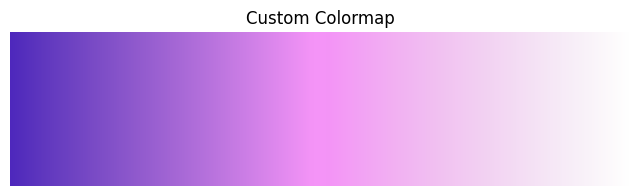

In [8]:
exotic_cmap = LinearSegmentedColormap.from_list('exotic', RGB)

gradient = np.linspace(0, 1, 256).reshape(1, -1)
gradient = np.vstack((gradient, gradient))

plt.figure(figsize=(8, 2))
plt.imshow(gradient, aspect='auto', cmap=exotic_cmap)
plt.axis('off')
plt.title("Custom Colormap")
# plt.show()


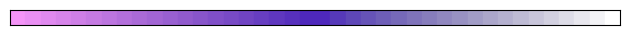

['#f494f7' '#ea8ef2' '#e089ee' '#d684ea' '#cd7ee6' '#c479e2' '#bb74de'
 '#b26fda' '#aa6ad7' '#a164d3' '#995fd0' '#905acd' '#8854ca' '#804fc7'
 '#7749c5' '#6f43c2' '#673dc0' '#5f37be' '#5630bd' '#4e27bc' '#4e27bc'
 '#5639b8' '#5e47b7' '#6653b6' '#6e5eb7' '#7668b8' '#7e73ba' '#877dbc'
 '#8f87bf' '#9891c2' '#a19bc6' '#aaa5ca' '#b4b0cf' '#bdbad4' '#c7c5d9'
 '#d2d0e0' '#dcdbe6' '#e7e7ee' '#f3f2f6' '#ffffff']


In [153]:
gradient3 = colour.algebra.lerp(
    np.linspace(0, 1, 20)[..., np.newaxis],
    CAM16UCS[1][np.newaxis],
    CAM16UCS[0][np.newaxis],
)
gradient4 = colour.algebra.lerp(
    np.linspace(0, 1, 20)[..., np.newaxis],
    CAM16UCS[0][np.newaxis],
    CAM16UCS[2][np.newaxis],
)
diverging_gradient = np.concatenate([gradient3, gradient4], axis=0)
diverging_RGB = np.clip(colour.convert(diverging_gradient, 'CAM16UCS', 'Output-Referred RGB'), 0, 1)

colour.plotting.plot_multi_colour_swatches(
    [colour.plotting.ColourSwatch(RGB=np.clip(x, 0, 1)) for x in diverging_RGB])

diverging_hex_codes = colour.convert(diverging_RGB, 'Output-Referred RGB', 'Hexadecimal')
print(diverging_hex_codes)

Text(0.5, 1.0, 'Custom Colormap')

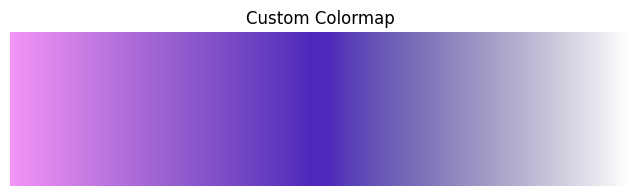

In [154]:
diverging_exotic_cmap = LinearSegmentedColormap.from_list('exotic', diverging_RGB)

gradient = np.linspace(0, 1, 256).reshape(1, -1)
gradient = np.vstack((gradient, gradient))

plt.figure(figsize=(8, 2))
plt.imshow(gradient, aspect='auto', cmap=diverging_exotic_cmap)
plt.axis('off')
plt.title("Custom Colormap")
# plt.show()

In [155]:
outdir_s2 = "/data/typhon2/hattie/jwst/wasp_17/pipeline_outputs_directory/Stage2/"
data_filenames_wasp17 = [
    outdir_s2 + "jw01353101001_04101_00001-seg001_nis_badpixstep.fits",
    # outdir_s2 + "jw02734002001_04101_00001-seg002_nis_badpixstep.fits",
    # outdir_s2 + "jw02734002001_04101_00001-seg003_nis_badpixstep.fits",
]

In [12]:
wasp17_data = []
wasp17_header = []
for filename in data_filenames_wasp17:
    with fits.open(filename) as hdulist:
        wasp17_data.append(hdulist[1].data)
        wasp17_header.append(hdulist[1].header)

def normalise_data(data, normalise_max=300):
    """Normalise data using input data for min and max."""

    data_max = np.max(data[0])
    normalisation_factor = normalise_max / data_max
    input_normalised = data * normalisation_factor
    return input_normalised

print(f"WASP-17 data min: {wasp17_data[0].min()}, max: {wasp17_data[0].max()}")

wasp17_data = np.concatenate(wasp17_data, axis=0)
wasp17_data = normalise_data(wasp17_data)
print(f"WASP-17 normalised data min: {wasp17_data.min()}, max: {wasp17_data.max()}")

wasp17_data = np.log1p(wasp17_data)
print(f"WASP-17 logged data min: {wasp17_data.min()}, max: {wasp17_data.max()}")

WASP-17 data min: 0.0, max: 522.5161743164062
WASP-17 normalised data min: 0.0, max: 300.0
WASP-17 logged data min: 0.0, max: 5.707110404968262


In [13]:
wasp17_header[0]

XTENSION= 'IMAGE   '           / Image extension                                
BITPIX  =                  -32 / array data type                                
NAXIS   =                    3 / number of array dimensions                     
NAXIS1  =                 2048                                                  
NAXIS2  =                  256                                                  
NAXIS3  =                  178                                                  
PCOUNT  =                    0 / number of parameters                           
GCOUNT  =                    1 / number of groups                               
EXTNAME = 'SCI     '           / extension name                                 
SRCTYPE = 'POINT   '           / Source type used for calibration               
MJD-BEG =    60023.45983046296 / [d] exposure start time in MJD                 
MJD-AVG =    60023.66585546296 / [d] exposure mid-point in MJD                  
MJD-END =    60023.871880462

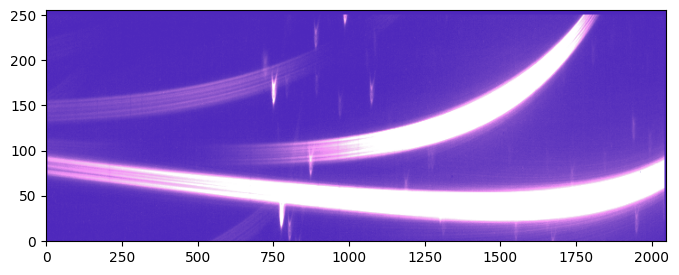

In [14]:
fig, ax = plt.subplots(figsize=(8, 3))
ax.imshow(np.expm1(wasp17_data[0]), aspect='auto', origin='lower', cmap=exotic_cmap, vmax=20)
plt.savefig("wasp17_data_image.png", dpi=300, transparent=True)

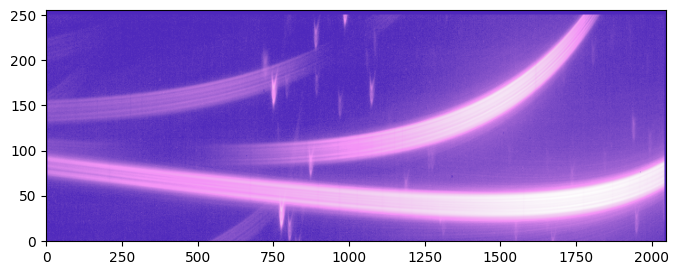

In [15]:
fig, ax = plt.subplots(figsize=(8, 3))
ax.imshow(wasp17_data[0], aspect='auto', origin='lower', cmap=exotic_cmap)
plt.savefig("wasp17_logged_data_image.png", dpi=300, transparent=True)

In [16]:
wasp17_data = np.reshape(wasp17_data, (wasp17_data.shape[0], wasp17_data.shape[1], wasp17_data.shape[2], 1))
decoded_wasp17 = model.predict(wasp17_data, verbose=1)

3/6 [==============>...............] - ETA: 33s

6/6 [==============================] - 62s 10s/step


In [17]:
np.reshape(wasp17_data, (wasp17_data.shape[0], wasp17_data.shape[1], wasp17_data.shape[2], 1)).shape

(178, 256, 2048, 1)

In [18]:
decoded_wasp17.min(), decoded_wasp17.max()

(0.0, 3.9818976)

In [19]:
def threshold_images(image):
    """Threshold images using Otsu's method."""
    threshold = threshold_otsu(image)
    binary_image = image > threshold
    clipped_image = np.where(image < threshold, 0, image)
    return clipped_image, binary_image

def get_clean_spectra(input_data, predicted_labels):
    """Get clean spectra by subtracting predicted labels from input data."""
    unlog_input_data = np.expm1(input_data)
    unlog_predicted_labels = np.expm1(predicted_labels)
    return unlog_input_data - unlog_predicted_labels


In [20]:
thresholded_wasp17 = np.asarray([threshold_images(image) for image in decoded_wasp17])
predicted_labels_wasp17 = np.asarray([image[0] for image in thresholded_wasp17])
predicted_clean_spectra_wasp17 = get_clean_spectra(wasp17_data, decoded_wasp17)

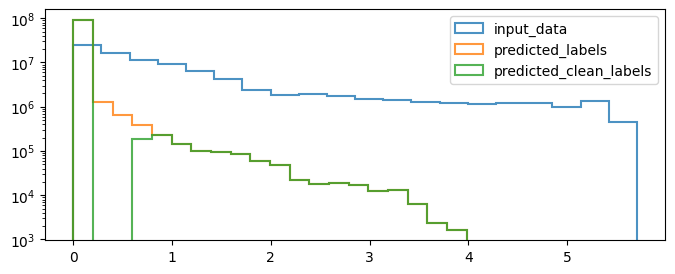

In [21]:
fig, ax = plt.subplots(1, figsize=(8, 3))
ax.hist(wasp17_data.flatten(), bins=20, histtype="step", label="input_data", linewidth=1.5, alpha=0.8)
ax.hist(decoded_wasp17.flatten(), bins=20, histtype="step", label="predicted_labels", linewidth=1.5, alpha=0.8)
ax.hist(predicted_labels_wasp17.flatten(), bins=20, histtype="step", label="predicted_clean_labels", linewidth=1.5, alpha=0.8)
ax.legend()
ax.set_yscale("log")

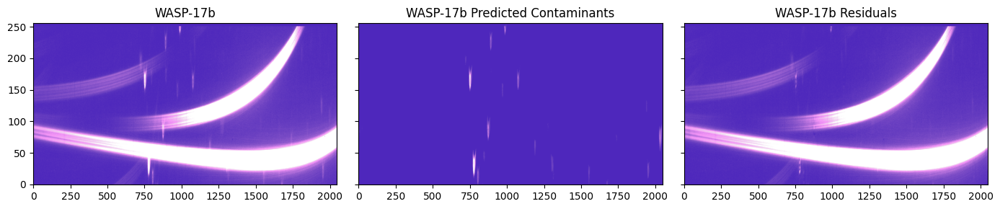

In [22]:
fig, ax = plt.subplots(1, 3, figsize=(14, 3), sharey=True)
ax[0].imshow(np.expm1(wasp17_data[0]), aspect="auto", origin="lower", vmin=0, vmax=20, cmap=exotic_cmap)
ax[1].imshow(np.expm1(predicted_labels_wasp17[0]), aspect="auto", origin="lower", vmin=0, vmax=20, cmap=exotic_cmap)
ax[2].imshow(predicted_clean_spectra_wasp17[0], aspect="auto", origin="lower", vmin=0, vmax=20, cmap=exotic_cmap)

ax[0].set_title("WASP-17b")
ax[1].set_title("WASP-17b Predicted Contaminants")
ax[2].set_title("WASP-17b Residuals")

plt.tight_layout()
plt.savefig("wasp17_clean_spectra.png", dpi=300, transparent=True)

Text(0.5, 1.0, 'WASP-17 Clean logged')

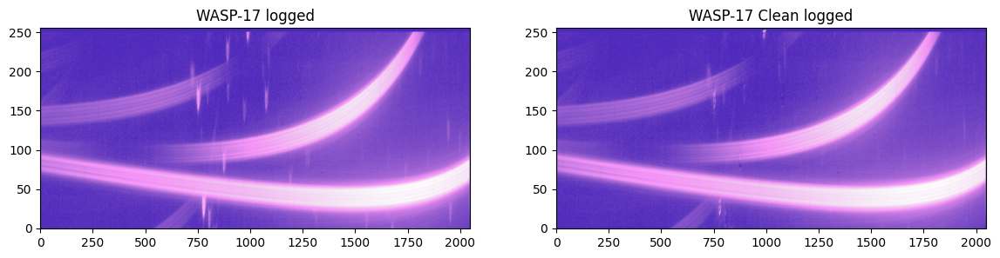

In [23]:
fig, ax = plt.subplots(1, 2, figsize=(14, 3))
ax[0].imshow(wasp17_data[0], aspect='auto', origin='lower', vmin=0, cmap=exotic_cmap)
ax[1].imshow(np.log1p(predicted_clean_spectra_wasp17[0]), aspect='auto', origin='lower', vmin=0, cmap=exotic_cmap)

ax[0].set_title("WASP-17 logged")
ax[1].set_title("WASP-17 Clean logged")

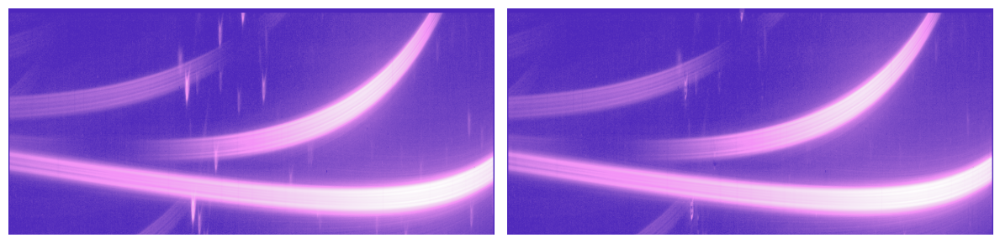

In [24]:
fig, ax = plt.subplots(1, 2, figsize=(12, 3))
ax[0].imshow(wasp17_data[0], aspect="auto", origin="lower", cmap=exotic_cmap)
ax[1].imshow(np.log1p(np.abs(predicted_clean_spectra_wasp17[0])), aspect="auto", origin="lower", cmap=exotic_cmap)

for axis in ax:
    axis.axis("off")
# ax[0].set_title("WASP-17")
# ax[1].set_title("WASP-17 Clean")

plt.tight_layout()

# plt.savefig("figures/wasp17_clean_spectra_logged.png", dpi=300, transparent=True)

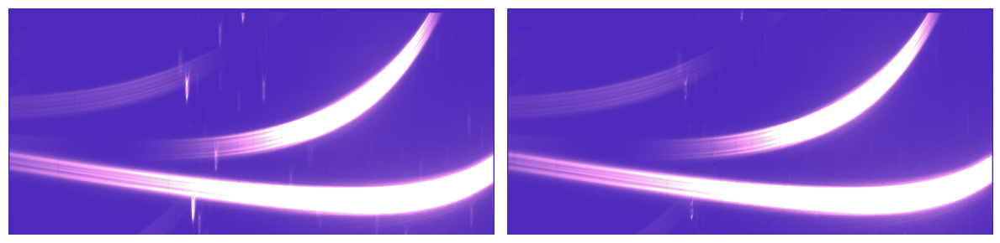

In [25]:
fig, ax = plt.subplots(1, 2, figsize=(12, 3))
ax[0].imshow(np.expm1(wasp17_data[0]), aspect="auto", origin="lower", cmap=exotic_cmap, vmax=30)
ax[1].imshow(np.abs(predicted_clean_spectra_wasp17[0]), aspect="auto", origin="lower", cmap=exotic_cmap, vmax=30)

for axis in ax:
    axis.axis("off")
# ax[0].set_title("WASP-17")
# ax[1].set_title("WASP-17 Clean")

plt.tight_layout()
# plt.savefig("figures/wasp17_clean_spectra.png", dpi=300, transparent=True)

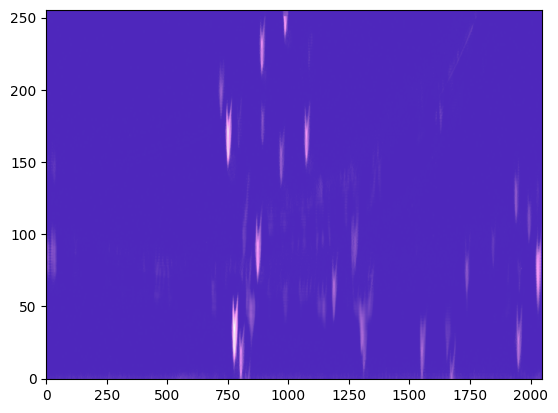

In [26]:
plt.imshow(decoded_wasp17[0, :, :, 0], aspect="auto", origin="lower", cmap=exotic_cmap)

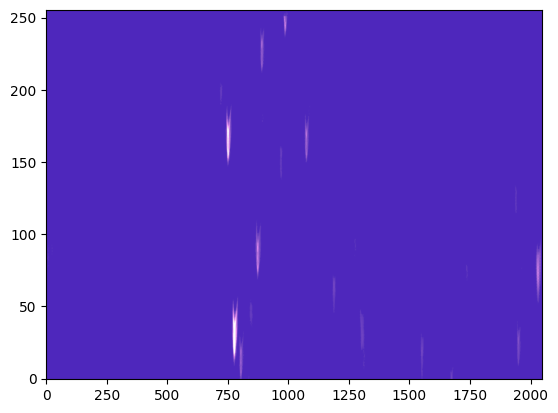

In [27]:

plt.imshow(np.expm1(predicted_labels_wasp17[0]), aspect="auto", origin="lower", vmin=0, vmax=20, cmap=exotic_cmap)

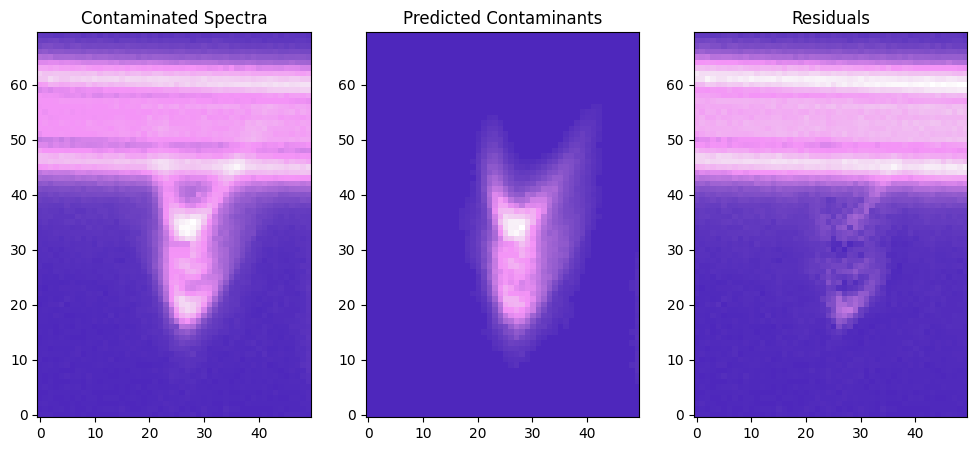

In [28]:
fig, ax = plt.subplots(1, 3, figsize=(12, 5))
ax[0].imshow(np.expm1(wasp17_data[0][:70, 750:800]), aspect="auto", origin="lower", cmap=exotic_cmap)
ax[1].imshow(np.expm1(predicted_labels_wasp17[0][:70, 750:800]), aspect="auto", origin="lower", cmap=exotic_cmap)
ax[2].imshow(np.abs(predicted_clean_spectra_wasp17[0][:70, 750:800]), aspect="auto", origin="lower", cmap=exotic_cmap)
ax[0].set_title("Contaminated Spectra")
ax[1].set_title("Predicted Contaminants")
ax[2].set_title("Residuals")

plt.savefig("wasp17_clean_spectra_zoomed.png", dpi=300, transparent=True)

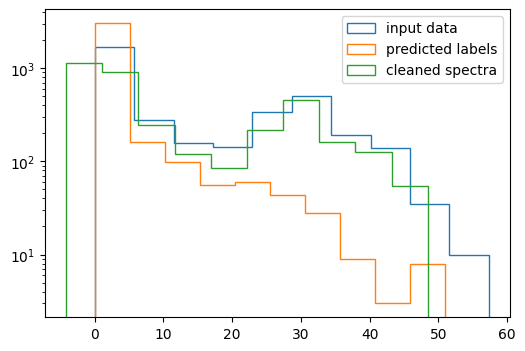

In [29]:
fig, ax = plt.subplots(1, figsize=(6, 4))
ax.hist(np.expm1(wasp17_data[0][:70, 750:800]).flatten(), label="input data", histtype="step")
ax.hist(np.expm1(predicted_labels_wasp17[0][:70, 750:800]).flatten(), label="predicted labels", histtype="step")
ax.hist(predicted_clean_spectra_wasp17[0][:70, 750:800].flatten(), label="cleaned spectra", histtype="step")

ax.legend()
ax.set_yscale("log")

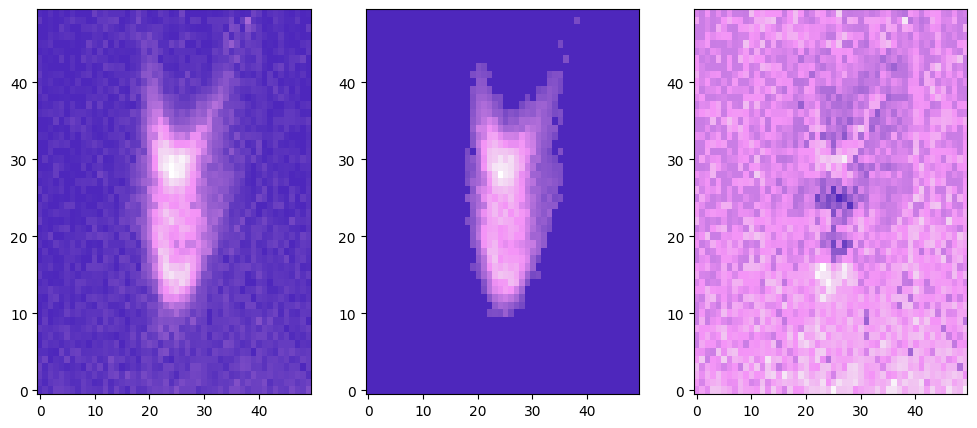

In [30]:
fig, ax = plt.subplots(1, 3, figsize=(12, 5))
ax[0].imshow(np.expm1(wasp17_data[0][140:190, 1050:1100]), aspect="auto", origin="lower", cmap=exotic_cmap)
ax[1].imshow(np.expm1(predicted_labels_wasp17[0][140:190, 1050:1100]), aspect="auto", origin="lower", cmap=exotic_cmap)
ax[2].imshow(predicted_clean_spectra_wasp17[0][140:190, 1050:1100], aspect="auto", origin="lower", cmap=exotic_cmap)

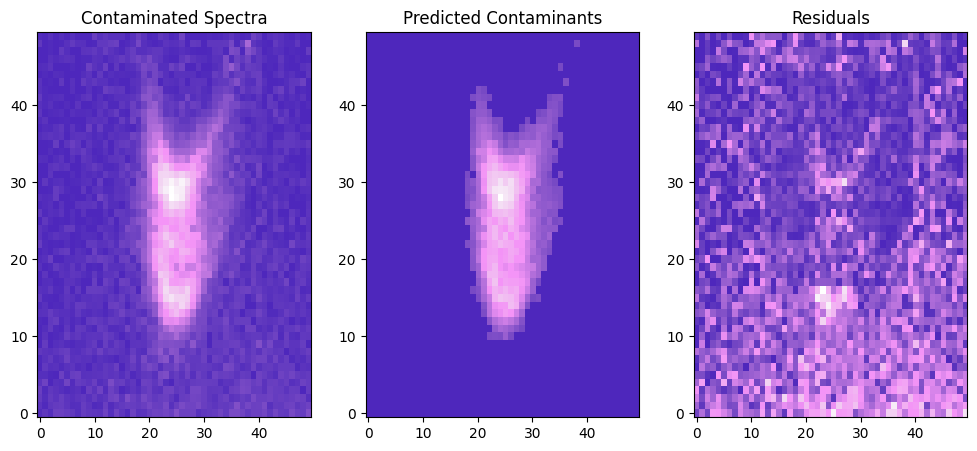

In [31]:
fig, ax = plt.subplots(1, 3, figsize=(12, 5))
ax[0].imshow(np.expm1(wasp17_data[0][140:190, 1050:1100]), aspect="auto", origin="lower", cmap=exotic_cmap)
ax[1].imshow(np.expm1(predicted_labels_wasp17[0][140:190, 1050:1100]), aspect="auto", origin="lower", cmap=exotic_cmap)
# absolute value on predicted_clean_spectra
ax[2].imshow(np.abs(predicted_clean_spectra_wasp17[0][140:190, 1050:1100]), aspect="auto", origin="lower", cmap=exotic_cmap)
ax[0].set_title("Contaminated Spectra")
ax[1].set_title("Predicted Contaminants")
ax[2].set_title("Residuals")

plt.savefig("wasp17_clean_spectra_zoomed2.png", dpi=300, transparent=True)

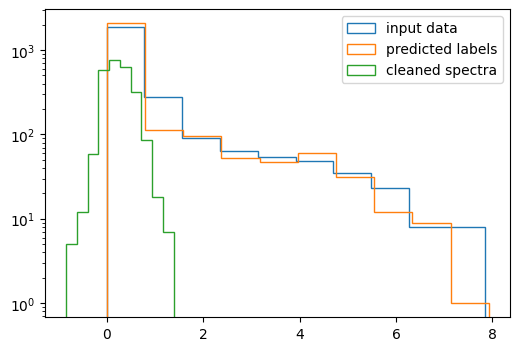

In [32]:
fig, ax = plt.subplots(1, figsize=(6, 4))
ax.hist(np.expm1(wasp17_data[0][140:190, 1050:1100]).flatten(), label="input data", histtype="step")
ax.hist(np.expm1(predicted_labels_wasp17[0][140:190, 1050:1100]).flatten(), label="predicted labels", histtype="step")
ax.hist(predicted_clean_spectra_wasp17[0][140:190, 1050:1100].flatten(), label="cleaned spectra", histtype="step")

ax.legend()
ax.set_yscale("log")

## WASP96

In [33]:
outdir_s2 = "/data/typhon2/hattie/jwst/wasp_96/pipeline_outputs_directory/Stage2/"
data_filenames_wasp96 = [
    outdir_s2 + "jw02734002001_04101_00001-seg001_nis_badpixstep.fits",
    # outdir_s2 + "jw02734002001_04101_00001-seg002_nis_badpixstep.fits",
    # outdir_s2 + "jw02734002001_04101_00001-seg003_nis_badpixstep.fits",
]

In [34]:
wasp96_data = []
wasp96_header = []
for filename in data_filenames_wasp96:
    with fits.open(filename) as hdulist:
        wasp96_data.append(hdulist[1].data)
        wasp96_header.append(hdulist[1].header)

print(f"WASP-96 data min: {wasp96_data[0].min()}, max: {wasp96_data[0].max()}")

wasp96_data = np.concatenate(wasp96_data, axis=0)
wasp96_data = normalise_data(wasp96_data)
print(f"WASP-96 normalised data min: {wasp96_data.min()}, max: {wasp96_data.max()}")

wasp96_data = np.log1p(wasp96_data)
print(f"WASP-96 logged data min: {wasp96_data.min()}, max: {wasp96_data.max()}")

WASP-96 data min: 0.0, max: 262.5325622558594
WASP-96 normalised data min: 0.0, max: 306.4815979003906
WASP-96 logged data min: 0.0, max: 5.728415012359619


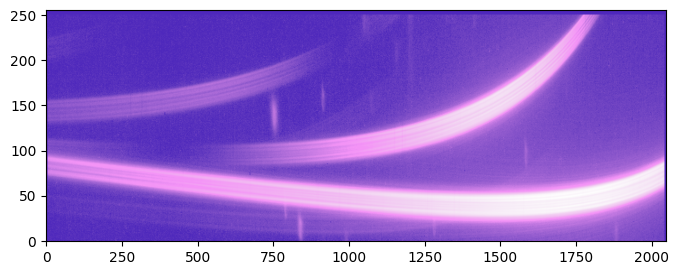

In [35]:
fig, ax = plt.subplots(figsize=(8, 3))
ax.imshow(wasp96_data[0], aspect='auto', origin='lower', cmap=exotic_cmap)

In [36]:
wasp96_data = np.reshape(wasp96_data, (wasp96_data.shape[0], wasp96_data.shape[1], wasp96_data.shape[2], 1))
decoded_wasp96 = model.predict(wasp96_data, verbose=1)

2/4 [==============>...............] - ETA: 22s

4/4 [==============================] - 35s 8s/step


In [37]:
decoded_wasp96.min(), decoded_wasp96.max()

(0.0, 2.6189957)

In [38]:
thresholded_wasp96 = np.asarray([threshold_images(image) for image in decoded_wasp96])
predicted_labels_wasp96 = np.asarray([image[0] for image in thresholded_wasp96])
predicted_clean_spectra_wasp96 = get_clean_spectra(wasp96_data, decoded_wasp96)

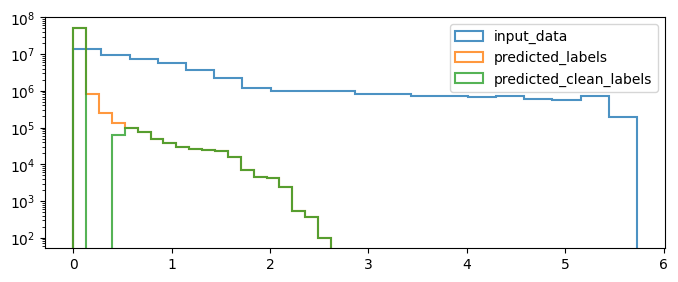

In [39]:
fig, ax = plt.subplots(1, figsize=(8, 3))
ax.hist(wasp96_data.flatten(), bins=20, histtype="step", label="input_data", linewidth=1.5, alpha=0.8)
ax.hist(decoded_wasp96.flatten(), bins=20, histtype="step", label="predicted_labels", linewidth=1.5, alpha=0.8)
ax.hist(predicted_labels_wasp96.flatten(), bins=20, histtype="step", label="predicted_clean_labels", linewidth=1.5, alpha=0.8)
ax.legend()
ax.set_yscale("log")

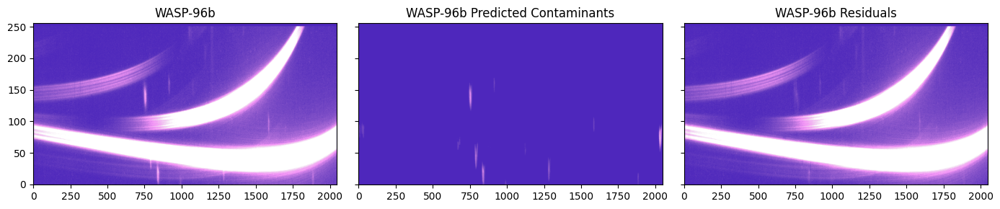

In [40]:
fig, ax = plt.subplots(1, 3, figsize=(14, 3), sharey=True)
ax[0].imshow(np.expm1(wasp96_data[0]), aspect="auto", origin="lower", vmin=0, vmax=10, cmap=exotic_cmap)
ax[1].imshow(np.expm1(predicted_labels_wasp96[0]), aspect="auto", origin="lower", vmin=0, vmax=10, cmap=exotic_cmap)
ax[2].imshow(predicted_clean_spectra_wasp96[0], aspect="auto", origin="lower", vmin=0, vmax=10, cmap=exotic_cmap)

ax[0].set_title("WASP-96b")
ax[1].set_title("WASP-96b Predicted Contaminants")
ax[2].set_title("WASP-96b Residuals")

plt.tight_layout()
plt.savefig("wasp96_clean_spectra.png", dpi=300, transparent=True)

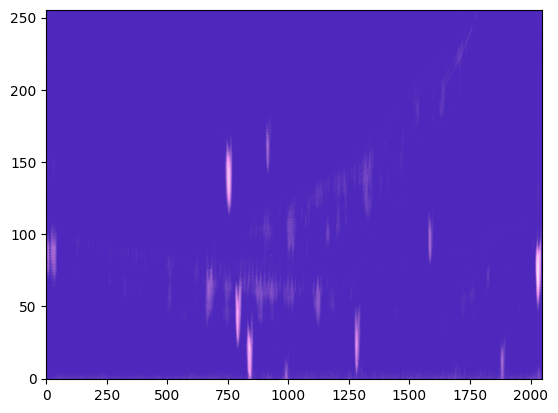

In [41]:
plt.imshow(decoded_wasp96[0, :, :, 0], aspect="auto", origin="lower", cmap=exotic_cmap)

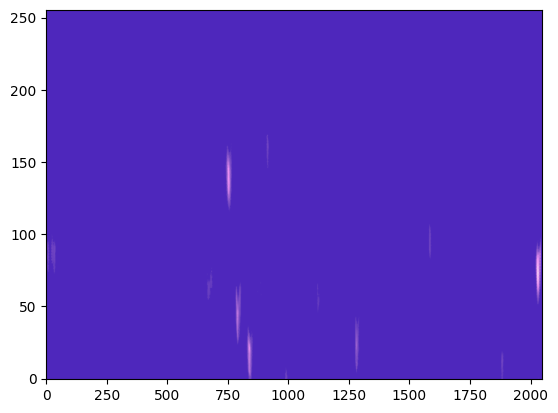

In [42]:

plt.imshow(np.expm1(predicted_labels_wasp96[0]), aspect="auto", origin="lower", vmin=0, vmax=10, cmap=exotic_cmap)

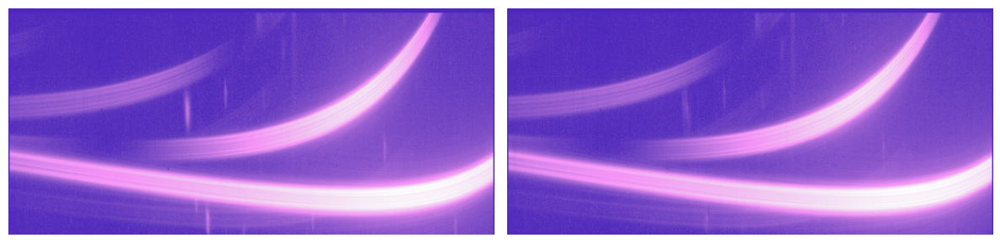

In [43]:
fig, ax = plt.subplots(1, 2, figsize=(12, 3))
ax[0].imshow(wasp96_data[0], aspect="auto", origin="lower", cmap=exotic_cmap)
ax[1].imshow(np.log1p(np.abs(predicted_clean_spectra_wasp96[0])), aspect="auto", origin="lower", cmap=exotic_cmap)

for axis in ax:
    axis.axis("off")
# ax[0].set_title("WASP-17")
# ax[1].set_title("WASP-17 Clean")

plt.tight_layout()

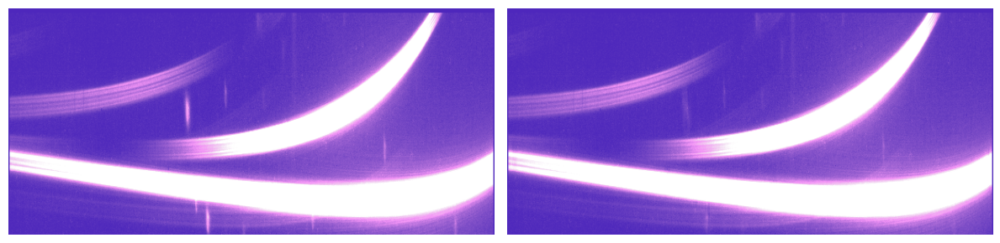

In [44]:
fig, ax = plt.subplots(1, 2, figsize=(12, 3))
ax[0].imshow(np.expm1(wasp96_data[0]), aspect="auto", origin="lower", cmap=exotic_cmap, vmax=10)
ax[1].imshow(np.abs(predicted_clean_spectra_wasp96[0]), aspect="auto", origin="lower", cmap=exotic_cmap, vmax=10)

for axis in ax:
    axis.axis("off")
# ax[0].set_title("WASP-17")
# ax[1].set_title("WASP-17 Clean")

plt.tight_layout()
# plt.savefig("figures/wasp96_clean_spectra.png", dpi=300, transparent=True)

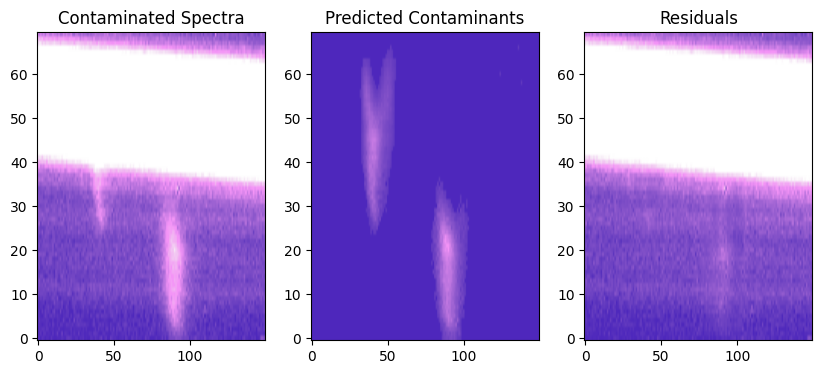

In [45]:
fig, ax = plt.subplots(1, 3, figsize=(10, 4))
ax[0].imshow(np.expm1(wasp96_data[0][:70, 750:900]), aspect="auto", origin="lower", vmin=0, vmax=10, cmap=exotic_cmap)
ax[1].imshow(np.expm1(predicted_labels_wasp96[0][:70, 750:900]), aspect="auto", origin="lower", vmin=0, vmax=10, cmap=exotic_cmap)
ax[2].imshow(predicted_clean_spectra_wasp96[0][:70, 750:900], aspect="auto", origin="lower", vmin=0, vmax=10, cmap=exotic_cmap)
ax[0].set_title("Contaminated Spectra")
ax[1].set_title("Predicted Contaminants")
ax[2].set_title("Residuals")
plt.savefig("wasp96_clean_spectra_zoomed.png", dpi=300, transparent=True)

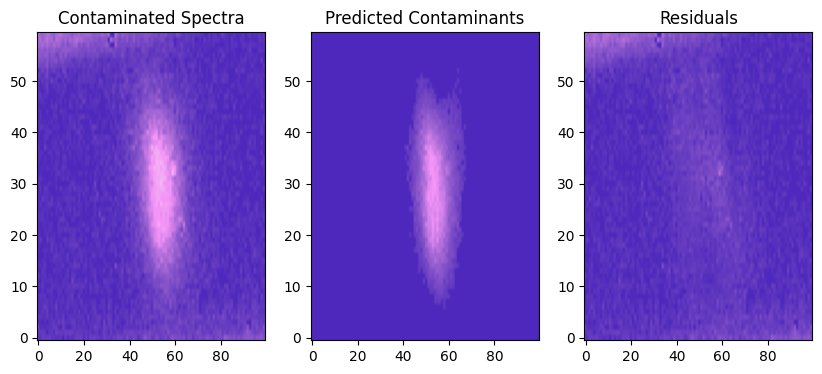

In [46]:
fig, ax = plt.subplots(1, 3, figsize=(10, 4))
ax[0].imshow(np.expm1(wasp96_data[0][110:170, 700:800]), aspect="auto", origin="lower", vmin=0, vmax=10, cmap=exotic_cmap)
ax[1].imshow(np.expm1(predicted_labels_wasp96[0][110:170, 700:800]), aspect="auto", origin="lower", vmin=0, vmax=10, cmap=exotic_cmap)
ax[2].imshow(predicted_clean_spectra_wasp96[0][110:170, 700:800], aspect="auto", origin="lower", vmin=0, vmax=10, cmap=exotic_cmap)

ax[0].set_title("Contaminated Spectra")
ax[1].set_title("Predicted Contaminants")
ax[2].set_title("Residuals")
plt.savefig("wasp96_clean_spectra_zoomed2.png", dpi=300, transparent=True)

## Test Simulations

In [47]:
ROOT_DIR="/data/typhon2/hattie/jwst/soss_simulations/unet_training_data/processed_data_2000"

data_test = np.load(os.path.join(ROOT_DIR, "data_test.npy"))
labels_test = np.load(os.path.join(ROOT_DIR, "labels_test.npy"))
clean_test = np.load(os.path.join(ROOT_DIR, "clean_test.npy"))

print(f"Data test shape: {data_test.shape}")
print(f"Labels test shape: {labels_test.shape}")
print(f"Clean test shape: {clean_test.shape}")

Data test shape: (200, 256, 2048, 1)
Labels test shape: (200, 256, 2048, 1)
Clean test shape: (200, 256, 2048, 1)


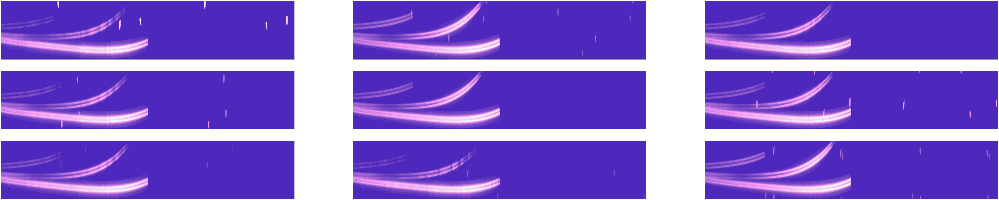

In [48]:
size = 3

fig, axs = plt.subplots(size, size,figsize=(100, 20))

count = 0
for i in range(size):
    for j in range(size):
        
        axs[i, j].imshow(np.concatenate((data_test[count, :, :, 0], labels_test[count, :, :, 0]), axis = -1), origin="lower", cmap=exotic_cmap, aspect="auto")
        axs[i, j].get_xaxis().set_visible(False)
        axs[i, j].get_yaxis().set_visible(False)
        count += 1

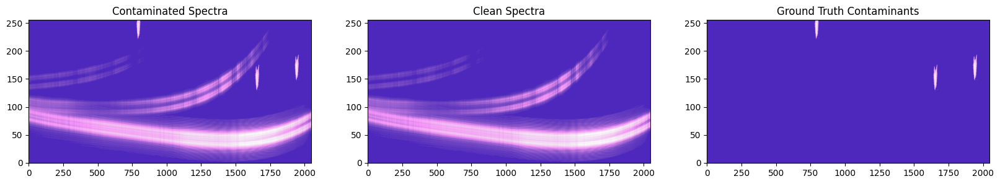

In [49]:
index = 0
fig, ax = plt.subplots(1, 3, figsize=(20, 3))
ax[0].imshow(data_test[index,:,:,0], aspect="auto", origin="lower", cmap=exotic_cmap)
ax[1].imshow(clean_test[index], aspect="auto", origin="lower", cmap=exotic_cmap)
ax[2].imshow(labels_test[index,:,:,0], aspect="auto", origin="lower", cmap=exotic_cmap)

ax[0].set_title("Contaminated Spectra")
ax[1].set_title("Clean Spectra")
ax[2].set_title("Ground Truth Contaminants")

plt.savefig("pre_processed_training_data.png", dpi=300, transparent=True)

In [50]:
print(data_test[index].min(), data_test[index].max())
print(labels_test[index].min(), labels_test[index].max())
print(clean_test[index].min(), clean_test[index].max())

print((np.exp(data_test[index]) - 1).min(), (np.exp(data_test[index]) - 1).max())
print((np.exp(labels_test[index]) - 1).min(), (np.exp(labels_test[index]) - 1).max())
print((np.exp(clean_test[index]) - 1).min(), (np.exp(clean_test[index]) - 1).max())

0.0 5.70711
0.0 5.42923
0.0 5.70711
0.0 300.0
0.0 226.974
0.0 300.0


In [51]:
decoded_images = model.predict(data_test, verbose=1)

3/7 [===========>..................] - ETA: 44s

7/7 [==============================] - 70s 10s/step


Text(0.5, 1.0, 'Predicted Clean Spectra')

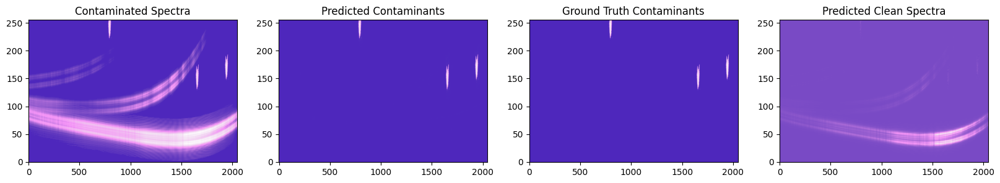

In [52]:
index = 0
fig, ax = plt.subplots(1, 4, figsize=(20, 3))
ax[0].imshow(data_test[index,:,:,0], aspect="auto", origin="lower", cmap=exotic_cmap)
ax[1].imshow(decoded_images[index,:,:,0], aspect="auto", origin="lower", cmap=exotic_cmap)
ax[2].imshow(labels_test[index,:,:,0], aspect="auto", origin="lower", cmap=exotic_cmap)
ax[3].imshow((np.exp(data_test[index,:,:,0]) -1) - (np.exp(decoded_images[index,:,:,0]) -1 ), aspect="auto", origin="lower", cmap=exotic_cmap)

ax[0].set_title("Contaminated Spectra")
ax[1].set_title("Predicted Contaminants")
ax[2].set_title("Ground Truth Contaminants")
ax[3].set_title("Predicted Clean Spectra")

In [53]:
def threshold_images(image):
    """Threshold images using Otsu's method."""
    threshold = threshold_otsu(image)
    binary_image = image > threshold
    clipped_image = np.where(image < threshold, 0, image)
    return clipped_image, binary_image

threhsolded_images = [threshold_images(image) for image in decoded_images]

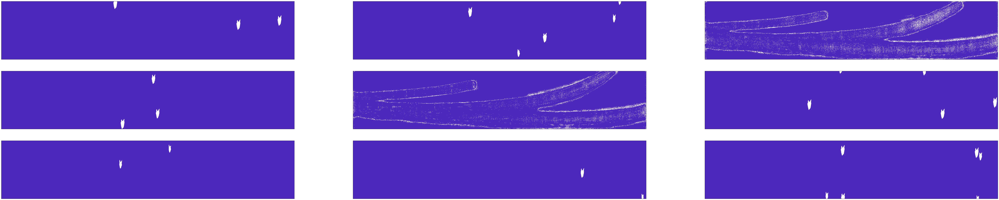

In [54]:
size = 3

fig, axs = plt.subplots(size, size,figsize=(100, 20))

count = 0
for i in range(size):
    for j in range(size):
        
        axs[i, j].imshow(threhsolded_images[count][1][:, :, 0], origin="lower", cmap=exotic_cmap, aspect="auto")
        axs[i, j].get_xaxis().set_visible(False)
        axs[i, j].get_yaxis().set_visible(False)
        count += 1

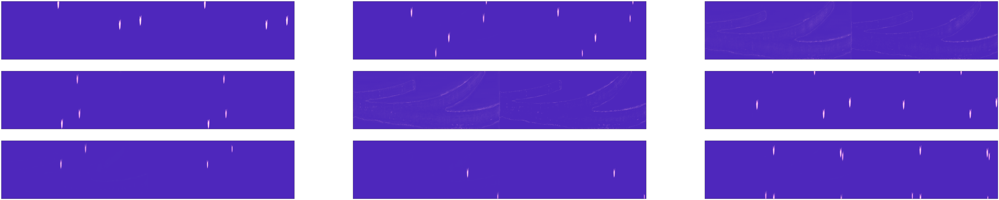

In [55]:
size = 3

fig, axs = plt.subplots(size, size,figsize=(100, 20))

count = 0
for i in range(size):
    for j in range(size):
        
        axs[i, j].imshow(np.concatenate((decoded_images[count, :, :, 0], threhsolded_images[count][0][:, :, 0]), axis = -1), origin="lower", cmap=exotic_cmap, aspect="auto")
        axs[i, j].get_xaxis().set_visible(False)
        axs[i, j].get_yaxis().set_visible(False)
        count += 1

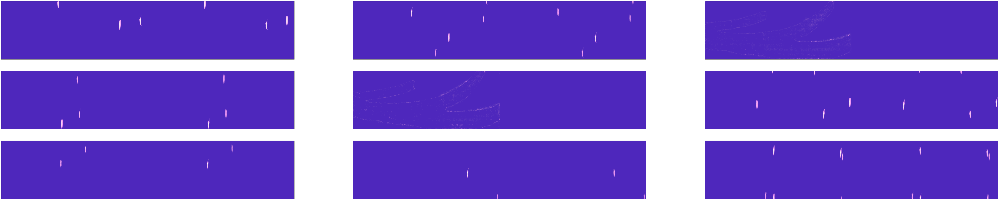

In [56]:
size = 3

fig, axs = plt.subplots(size, size,figsize=(100, 20))

count = 0
for i in range(size):
    for j in range(size):
        
        axs[i, j].imshow(np.concatenate((threhsolded_images[count][0][:, :, 0], labels_test[count, :, :, 0]), axis = -1), origin="lower", cmap=exotic_cmap, aspect="auto")
        axs[i, j].get_xaxis().set_visible(False)
        axs[i, j].get_yaxis().set_visible(False)
        count += 1

In [57]:
def get_clean_spectra(input_data, predicted_labels):
    """Get clean spectra by subtracting predicted labels from input data."""
    unlog_input_data = np.expm1(input_data)
    unlog_predicted_labels = np.expm1(predicted_labels)
    return unlog_input_data - unlog_predicted_labels

predicted_clean_spectra = get_clean_spectra(data_test, decoded_images)

In [58]:
def calculate_residuals(true_data, predicted_data):
    """Calculate residuals between true and predicted data."""
    return true_data - predicted_data

test_clean_simulations_unlogged = np.expm1(clean_test[:, :, :, 0])
residuals = calculate_residuals(test_clean_simulations_unlogged, predicted_clean_spectra[:, :, :, 0])

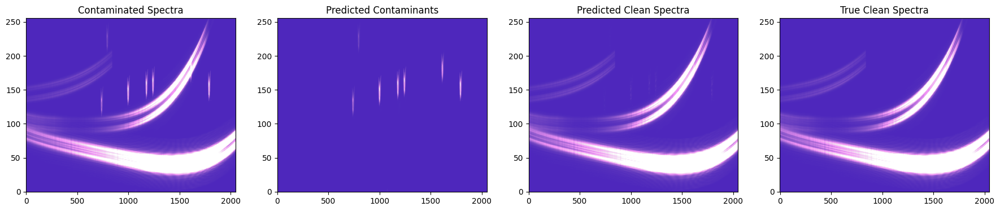

In [156]:
plot_index = 31
fig, ax = plt.subplots(1, 4, figsize=(22, 4))
ax[0].imshow(np.exp(data_test[plot_index, :, :, 0]) - 1, aspect="auto", origin="lower", cmap=exotic_cmap, vmax=30, vmin=0)
ax[1].imshow(np.exp(decoded_images[plot_index, :, :, 0]) - 1, aspect="auto", origin="lower", cmap=exotic_cmap, vmax=30, vmin=0)
ax[2].imshow(predicted_clean_spectra[plot_index, :, :, 0], aspect="auto", origin="lower", cmap=exotic_cmap, vmax=30, vmin=0)
ax[3].imshow((np.exp(clean_test[plot_index])-1), aspect="auto", origin="lower", cmap=exotic_cmap, vmax=30, vmin=0)

ax[0].set_title("Contaminated Spectra")
ax[1].set_title("Predicted Contaminants")
ax[2].set_title("Predicted Clean Spectra")
ax[3].set_title("True Clean Spectra")

plt.savefig("test_dataset_clean_spectra.png", dpi=300, transparent=True)

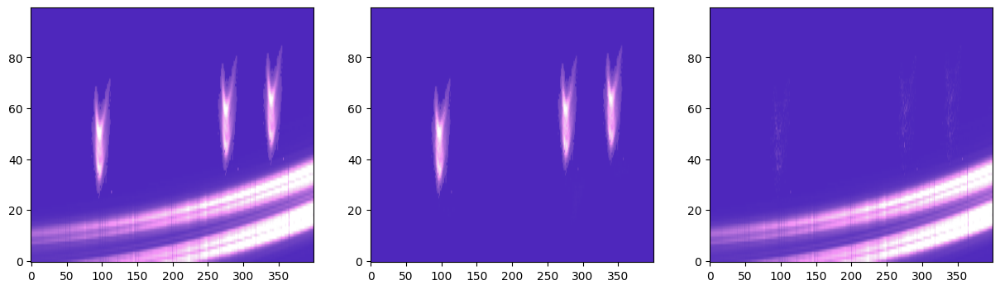

In [157]:
plot_index = 31
fig, ax = plt.subplots(1, 3, figsize=(15, 4))
ax[0].imshow(np.exp(data_test[plot_index, :, :, 0][100:200, 900:1300]) - 1, aspect="auto", origin="lower", cmap=exotic_cmap, vmax=30, vmin=0)
ax[1].imshow(np.exp(decoded_images[plot_index, :, :, 0][100:200, 900:1300]) - 1, aspect="auto", origin="lower", cmap=exotic_cmap, vmax=30, vmin=0)
ax[2].imshow(predicted_clean_spectra[plot_index, :, :, 0][100:200, 900:1300], aspect="auto", origin="lower", cmap=exotic_cmap, vmax=30, vmin=0)
# ax[3].imshow((np.exp(clean_test[plot_index][100:200, 900:1250])-1), aspect="auto", origin="lower", cmap=exotic_cmap, vmax=30, vmin=0)

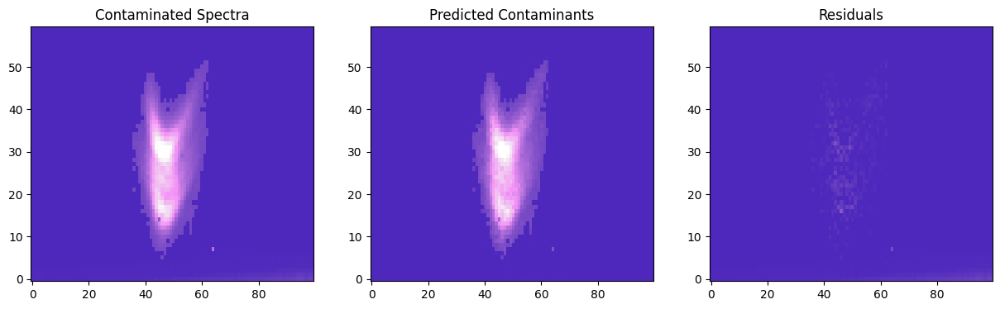

In [158]:
plot_index = 31
fig, ax = plt.subplots(1, 3, figsize=(15, 4))
ax[0].imshow(np.exp(data_test[plot_index, :, :, 0][120:180, 950:1050]) - 1, aspect="auto", origin="lower", cmap=exotic_cmap, vmax=30, vmin=0)
ax[1].imshow(np.exp(decoded_images[plot_index, :, :, 0][120:180, 950:1050]) - 1, aspect="auto", origin="lower", cmap=exotic_cmap, vmax=30, vmin=0)
ax[2].imshow(predicted_clean_spectra[plot_index, :, :, 0][120:180, 950:1050], aspect="auto", origin="lower", cmap=exotic_cmap, vmax=30, vmin=0)
# ax[3].imshow((np.exp(clean_test[plot_index][120:180, 950:1050])-1), aspect="auto", origin="lower", cmap=exotic_cmap, vmax=30, vmin=0)

ax[0].set_title("Contaminated Spectra")
ax[1].set_title("Predicted Contaminants")
ax[2].set_title("Residuals")

plt.savefig("test_dataset_clean_contaminant.png", dpi=300, transparent=True)

In [159]:
# plt.imshow((residuals[plot_index]/test_clean_simulations_unlogged[plot_index].max())*100, aspect="auto", origin="lower", cmap=diverging_exotic_cmap)
# # plt.colorbar(label="percentage residual flux")
# plt.savefig("test_dataset_residuals.png", dpi=300, transparent=True)

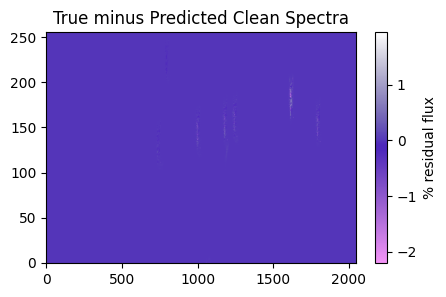

In [160]:
fig, ax = plt.subplots(1, figsize=(5, 3))
im = ax.imshow((residuals[plot_index]/test_clean_simulations_unlogged[plot_index].max())*100, aspect="auto", origin="lower", cmap=diverging_exotic_cmap)
ax.set_title("True minus Predicted Clean Spectra")
fig.colorbar(im, label="% residual flux")
plt.savefig("test_dataset_residuals.png", dpi=300, transparent=True)

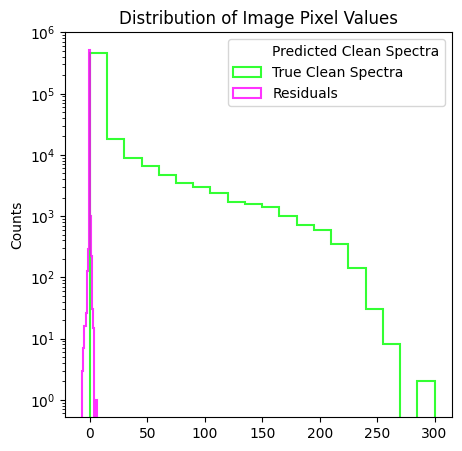

In [161]:
fig, ax = plt.subplots(1, figsize=(5, 5))

ax.hist(predicted_clean_spectra[plot_index].flatten(), bins=20, histtype="step", label="Predicted Clean Spectra", linewidth=1.5, alpha=0.8, color="white")
ax.hist(test_clean_simulations_unlogged[plot_index].flatten(), bins=20, histtype="step", label="True Clean Spectra", linewidth=1.5, alpha=0.8, color="lime")
# ax.hist(np.expm1(decoded_images[plot_index].flatten()), bins=20, histtype="step", label="Predicted Contaminants", linewidth=1.5, alpha=0.8)
ax.hist(residuals[plot_index].flatten(), bins=20, histtype="step", label="Residuals", linewidth=1.5, alpha=0.8, color="magenta")

ax.legend()
ax.set_yscale("log")
ax.set_title("Distribution of Image Pixel Values")
ax.set_ylabel("Counts")

plt.savefig("test_dataset_histogram.png", dpi=300, transparent=True)

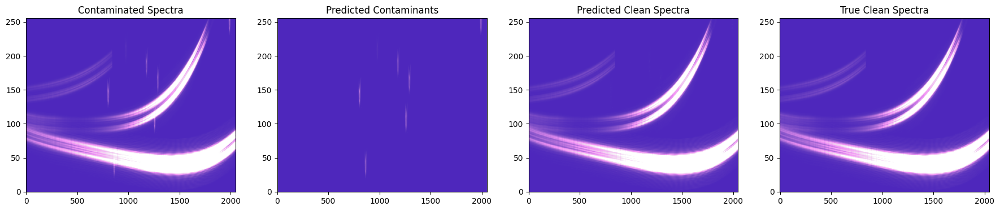

In [138]:
plot_index = 46
fig, ax = plt.subplots(1, 4, figsize=(22, 4))
ax[0].imshow(np.exp(data_test[plot_index, :, :, 0]) - 1, aspect="auto", origin="lower", cmap=exotic_cmap, vmax=30, vmin=0)
ax[1].imshow(np.exp(decoded_images[plot_index, :, :, 0]) - 1, aspect="auto", origin="lower", cmap=exotic_cmap, vmax=30, vmin=0)
ax[2].imshow(predicted_clean_spectra[plot_index, :, :, 0], aspect="auto", origin="lower", cmap=exotic_cmap, vmax=30, vmin=0)
ax[3].imshow((np.exp(clean_test[plot_index])-1), aspect="auto", origin="lower", cmap=exotic_cmap, vmax=30, vmin=0)

ax[0].set_title("Contaminated Spectra")
ax[1].set_title("Predicted Contaminants")
ax[2].set_title("Predicted Clean Spectra")
ax[3].set_title("True Clean Spectra")

plt.savefig("test_dataset_clean_spectra_2.png", dpi=300, transparent=True)

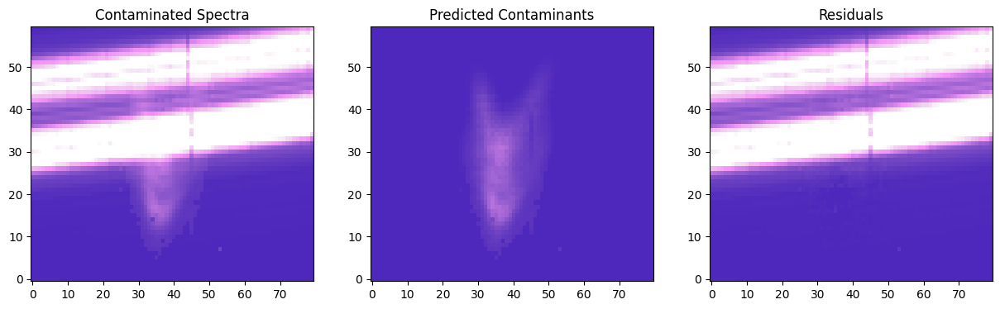

In [139]:
plot_index = 46
fig, ax = plt.subplots(1, 3, figsize=(15, 4))
ax[0].imshow(np.exp(data_test[plot_index, :, :, 0][80:140, 1220:1300]) - 1, aspect="auto", origin="lower", cmap=exotic_cmap, vmax=30, vmin=0)
ax[1].imshow(np.exp(decoded_images[plot_index, :, :, 0][80:140, 1220:1300]) - 1, aspect="auto", origin="lower", cmap=exotic_cmap, vmax=30, vmin=0)
ax[2].imshow(predicted_clean_spectra[plot_index, :, :, 0][80:140, 1220:1300], aspect="auto", origin="lower", cmap=exotic_cmap, vmax=30, vmin=0)
# ax[3].imshow((np.exp(clean_test[plot_index][120:180, 950:1050])-1), aspect="auto", origin="lower", cmap=exotic_cmap, vmax=30, vmin=0)


ax[0].set_title("Contaminated Spectra")
ax[1].set_title("Predicted Contaminants")
ax[2].set_title("Residuals")

plt.savefig("test_dataset_clean_contaminant_2.png", dpi=300, transparent=True)

In [140]:
# labels_test[plot_index].max()
residuals[plot_index].max()

2.0234222

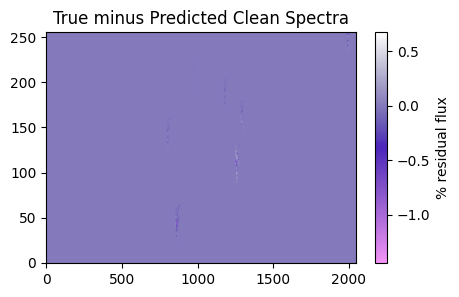

In [145]:
fig, ax = plt.subplots(1, figsize=(5, 3))
im = ax.imshow((residuals[plot_index]/test_clean_simulations_unlogged[plot_index].max())*100, aspect="auto", origin="lower", cmap=diverging_exotic_cmap)
ax.set_title("True minus Predicted Clean Spectra")
fig.colorbar(im, label="% residual flux")
plt.savefig("test_dataset_residuals_2.png", dpi=300, transparent=True)

In [142]:
# plt.imshow((residuals[plot_index]/(labels_test[plot_index].max()))*100, aspect="auto", origin="lower", cmap=diverging_exotic_cmap)
# plt.colorbar()

# plt.savefig("test_dataset_residuals_2.png", dpi=300, transparent=True)

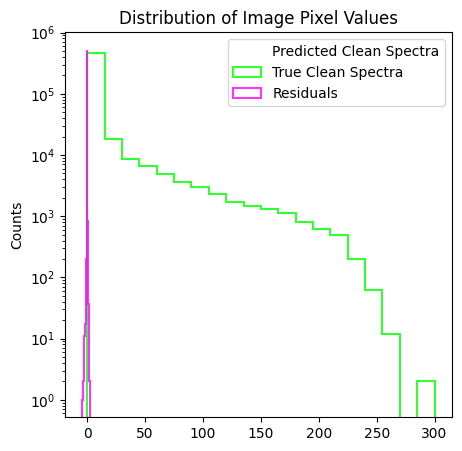

In [143]:
fig, ax = plt.subplots(1, figsize=(5, 5))

ax.hist(predicted_clean_spectra[plot_index].flatten(), bins=20, histtype="step", label="Predicted Clean Spectra", linewidth=1.5, alpha=0.8, color="white")
ax.hist(test_clean_simulations_unlogged[plot_index].flatten(), bins=20, histtype="step", label="True Clean Spectra", linewidth=1.5, alpha=0.8, color="lime")
ax.hist(residuals[plot_index].flatten(), bins=20, histtype="step", label="Residuals", linewidth=1.5, alpha=0.8, color="magenta")

ax.legend()
ax.set_yscale("log")
ax.set_title("Distribution of Image Pixel Values")

ax.set_ylabel("Counts")

plt.savefig("test_dataset_histogram_2.png", dpi=300, transparent=True)

Text(0.5, 1.0, 'True Clean Spectra')

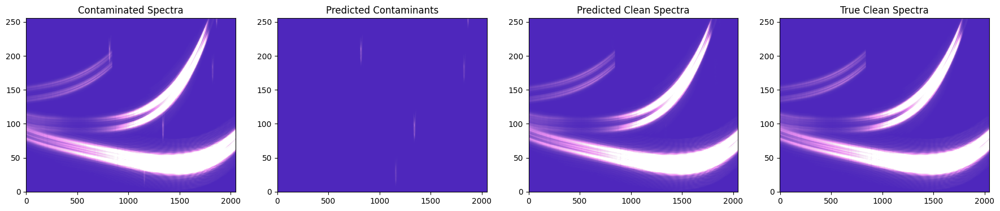

In [69]:
plot_index = 1
fig, ax = plt.subplots(1, 4, figsize=(22, 4))
ax[0].imshow(np.exp(data_test[plot_index, :, :, 0]) - 1, aspect="auto", origin="lower", cmap=exotic_cmap, vmax=20, vmin=0)
ax[1].imshow(np.exp(decoded_images[plot_index, :, :, 0]) - 1, aspect="auto", origin="lower", cmap=exotic_cmap, vmax=20, vmin=0)
ax[2].imshow(predicted_clean_spectra[plot_index, :, :, 0], aspect="auto", origin="lower", cmap=exotic_cmap, vmax=20, vmin=0)
ax[3].imshow((np.exp(clean_test[plot_index])-1), aspect="auto", origin="lower", cmap=exotic_cmap, vmax=20, vmin=0)

ax[0].set_title("Contaminated Spectra")
ax[1].set_title("Predicted Contaminants")
ax[2].set_title("Predicted Clean Spectra")
ax[3].set_title("True Clean Spectra")

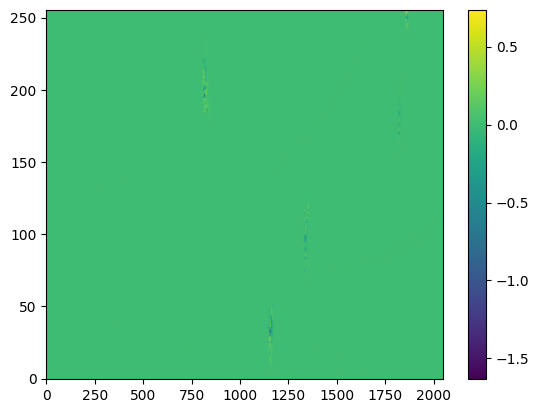

In [70]:
plt.imshow(residuals[plot_index], aspect="auto", origin="lower")
plt.colorbar()

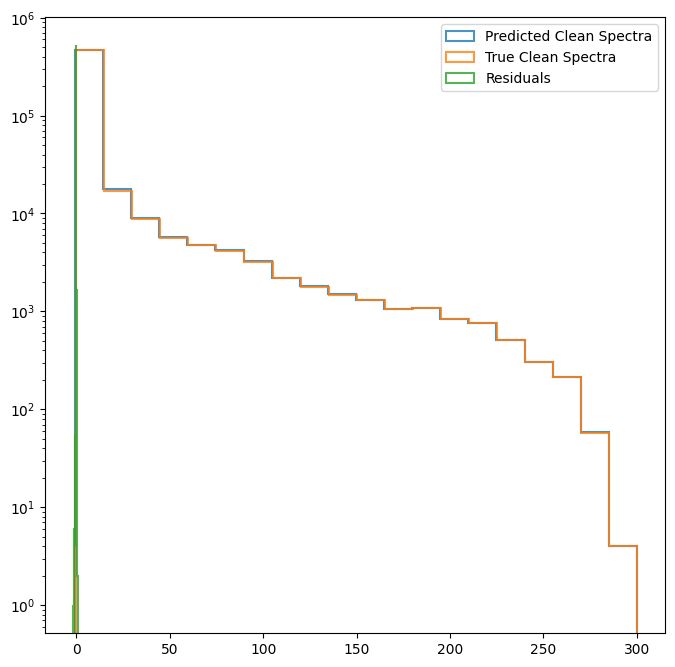

In [71]:
fig, ax = plt.subplots(1, figsize=(8, 8))

ax.hist(predicted_clean_spectra[plot_index].flatten(), bins=20, histtype="step", label="Predicted Clean Spectra", linewidth=1.5, alpha=0.8)
ax.hist(test_clean_simulations_unlogged[plot_index].flatten(), bins=20, histtype="step", label="True Clean Spectra", linewidth=1.5, alpha=0.8)
ax.hist(residuals[plot_index].flatten(), bins=20, histtype="step", label="Residuals", linewidth=1.5, alpha=0.8)

ax.legend()
ax.set_yscale("log")

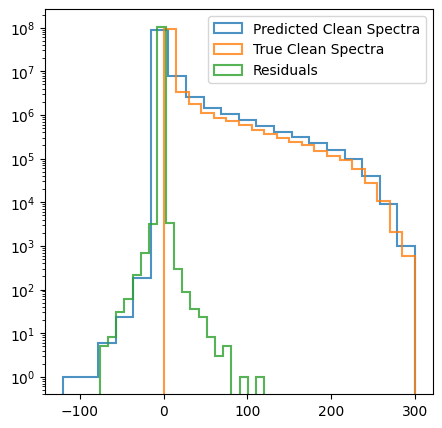

In [72]:
fig, ax = plt.subplots(1, figsize=(5, 5))

ax.hist(predicted_clean_spectra.flatten(), bins=20, histtype="step", label="Predicted Clean Spectra", linewidth=1.5, alpha=0.8)
ax.hist(test_clean_simulations_unlogged.flatten(), bins=20, histtype="step", label="True Clean Spectra", linewidth=1.5, alpha=0.8)
ax.hist(residuals.flatten(), bins=20, histtype="step", label="Residuals", linewidth=1.5, alpha=0.8)

ax.legend()
ax.set_yscale("log")

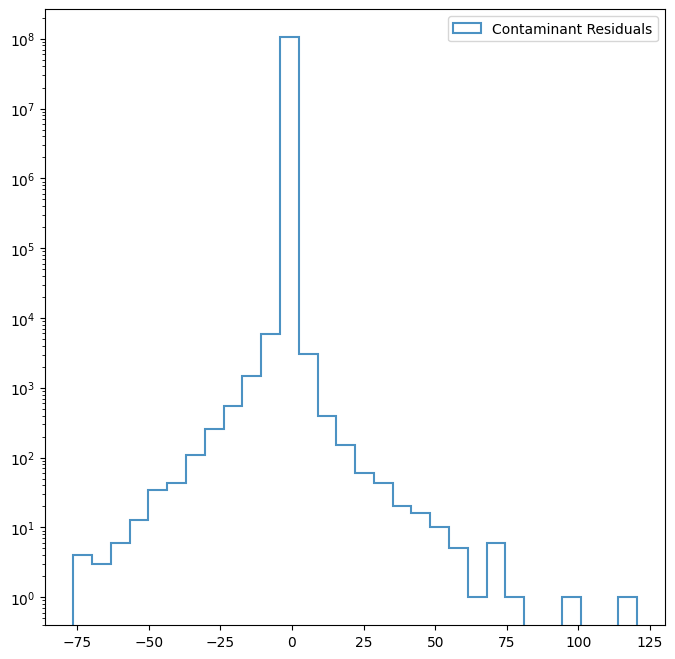

In [73]:
fig, ax = plt.subplots(1, figsize=(8, 8))
ax.hist(residuals.flatten(), bins=30, histtype="step", label="Contaminant Residuals", linewidth=1.5, alpha=0.8)

ax.legend()
ax.set_yscale("log")